<a href="https://colab.research.google.com/github/cszafariqbal/Deep_Learning_Projects/blob/main/Generative_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Training Generative Adversarial Networks (GANs) in PyTorch

#Downloading and Exploring the Data

In [ ]:
!pip install opendatasets

In [ ]:
import opendatasets as od
url = "https://www.kaggle.com/datasets/muhammadhananasghar/5-famous-people-face-recognition"
od.download(url)

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: zeeooma
Your Kaggle Key: ··········


100%|██████████| 14.3M/14.3M [00:00<00:00, 81.3MB/s]

In [ ]:
import os
file_path = './5-famous-people-face-recognition'
os.listdir(file_path)

['data']

In [ ]:
os.listdir(file_path + "/data")

['train', 'valid']

In [ ]:
os.listdir(file_path + "/data/train")

['elon_musk', 'jeff_bezos', 'bill_gates', 'steve_jobs', 'mark_zuckerberg']

In [ ]:
path = '/content/images'

#import the required laibrary

In [ ]:
import torch
import torchvision
from torchvision.datasets import ImageFolder
import torchvision.transforms as T

In [ ]:
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

#Convert the Images into Tensor And Make the Images Dataset

In [ ]:
images_ds = ImageFolder(path, T.Compose([T.Resize(image_size), T.CenterCrop(image_size), T.ToTensor(), T.Normalize(*stats)]))

#Make the Images DataLoader

In [ ]:
from torch.utils.data import DataLoader

images_dl = DataLoader(images_ds, batch_size=batch_size, shuffle=True, num_workers=3, pin_memory=True)

#plot the Batch of images

In [ ]:
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
%matplotlib inline

def denorm_image(img_tensor):
  return img_tensor * stats[1][0] + stats[0][0]

In [ ]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(16, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm_image(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))


def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break

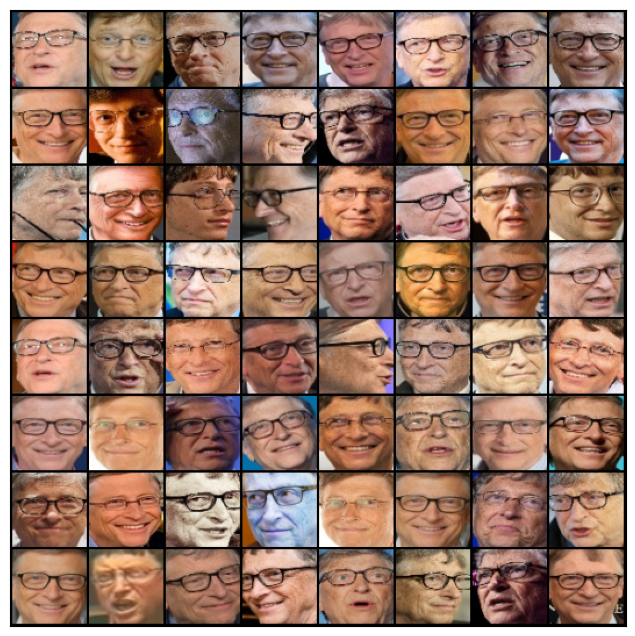

In [ ]:
show_batch(images_dl)

#load data in GPU if one avaliable

In [ ]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')

def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl:
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [ ]:
device  = get_default_device()
device

device(type='cuda')

In [ ]:
images_dl = DeviceDataLoader(images_dl, device)

#Create Discriminator model

In [ ]:
import torch.nn as nn
discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

In [ ]:
discriminator = to_device(discriminator, device)

In [ ]:
latent_size = 128

#Create Generator Model

In [ ]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

torch.Size([128, 3, 64, 64])


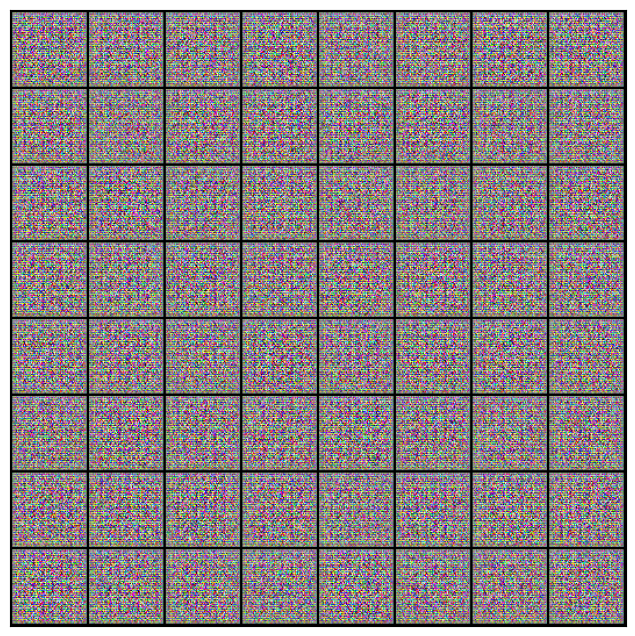

In [ ]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

In [ ]:
generator = to_device(generator, device)

#Train The descriminator Model

In [ ]:
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

#Train Generator Model

In [ ]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)

    # Update generator weights
    loss.backward()
    opt_g.step()

    return loss.item()

# Save The Genrated Images In Directory

In [ ]:
from torchvision.utils import save_image

In [ ]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [ ]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm_image(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        print(fake_images.shape)
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [ ]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

Saving generated-images-0000.png
torch.Size([64, 3, 64, 64])


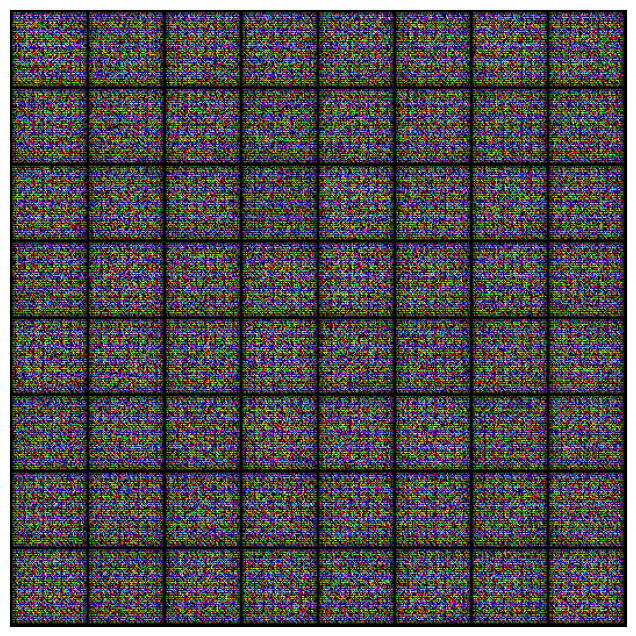

In [ ]:
save_samples(0, fixed_latent)

In [ ]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [ ]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()

    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []

    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))

    for epoch in range(epochs):
        for real_images, _ in tqdm(images_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)

        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)

        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))

        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)

    return losses_g, losses_d, real_scores, fake_scores

In [ ]:
lr = 0.002
epochs = 100

In [ ]:
history = fit(epochs, lr)

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [1/100], loss_g: 1.6855, loss_d: 0.5454, real_score: 0.8198, fake_score: 0.2540
Saving generated-images-0001.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [2/100], loss_g: 3.4375, loss_d: 0.3108, real_score: 0.8805, fake_score: 0.1251
Saving generated-images-0002.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [3/100], loss_g: 4.0446, loss_d: 4.9876, real_score: 0.0213, fake_score: 0.0098
Saving generated-images-0003.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [4/100], loss_g: 2.4540, loss_d: 1.1596, real_score: 0.6612, fake_score: 0.3226
Saving generated-images-0004.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [5/100], loss_g: 2.7546, loss_d: 0.7702, real_score: 0.6249, fake_score: 0.0661
Saving generated-images-0005.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [6/100], loss_g: 5.1082, loss_d: 0.3964, real_score: 0.9838, fake_score: 0.2825
Saving generated-images-0006.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [7/100], loss_g: 3.6795, loss_d: 1.5678, real_score: 0.4207, fake_score: 0.0481
Saving generated-images-0007.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [8/100], loss_g: 4.3130, loss_d: 0.8240, real_score: 0.6666, fake_score: 0.2047
Saving generated-images-0008.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [9/100], loss_g: 5.0214, loss_d: 0.1281, real_score: 0.9621, fake_score: 0.0785
Saving generated-images-0009.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [10/100], loss_g: 4.7273, loss_d: 0.1223, real_score: 0.9235, fake_score: 0.0212
Saving generated-images-0010.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [11/100], loss_g: 4.5992, loss_d: 0.0570, real_score: 0.9930, fake_score: 0.0477
Saving generated-images-0011.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [12/100], loss_g: 4.6400, loss_d: 0.5360, real_score: 0.8065, fake_score: 0.0480
Saving generated-images-0012.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [13/100], loss_g: 3.1914, loss_d: 0.3612, real_score: 0.9224, fake_score: 0.2089
Saving generated-images-0013.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [14/100], loss_g: 2.6513, loss_d: 0.7633, real_score: 0.9953, fake_score: 0.4534
Saving generated-images-0014.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [15/100], loss_g: 3.7760, loss_d: 0.3744, real_score: 0.8662, fake_score: 0.1106
Saving generated-images-0015.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [16/100], loss_g: 1.9718, loss_d: 0.5523, real_score: 0.6713, fake_score: 0.0616
Saving generated-images-0016.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [17/100], loss_g: 3.2916, loss_d: 0.3234, real_score: 0.8922, fake_score: 0.1436
Saving generated-images-0017.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [18/100], loss_g: 4.3471, loss_d: 0.3336, real_score: 0.9104, fake_score: 0.1382
Saving generated-images-0018.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [19/100], loss_g: 4.0476, loss_d: 0.2384, real_score: 0.9529, fake_score: 0.1562
Saving generated-images-0019.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [20/100], loss_g: 7.8720, loss_d: 0.0747, real_score: 0.9397, fake_score: 0.0013
Saving generated-images-0020.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [21/100], loss_g: 4.5919, loss_d: 0.0152, real_score: 0.9975, fake_score: 0.0122
Saving generated-images-0021.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [22/100], loss_g: 2.5722, loss_d: 3.5495, real_score: 0.0788, fake_score: 0.0107
Saving generated-images-0022.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [23/100], loss_g: 4.3897, loss_d: 0.5478, real_score: 0.9691, fake_score: 0.3764
Saving generated-images-0023.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [24/100], loss_g: 4.5040, loss_d: 0.2035, real_score: 0.9662, fake_score: 0.1351
Saving generated-images-0024.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [25/100], loss_g: 3.9949, loss_d: 0.0318, real_score: 0.9900, fake_score: 0.0208
Saving generated-images-0025.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [26/100], loss_g: 12.7946, loss_d: 7.6722, real_score: 0.9878, fake_score: 0.9976
Saving generated-images-0026.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [27/100], loss_g: 3.1091, loss_d: 0.3536, real_score: 0.8600, fake_score: 0.1298
Saving generated-images-0027.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [28/100], loss_g: 4.2438, loss_d: 0.3191, real_score: 0.8490, fake_score: 0.0779
Saving generated-images-0028.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [29/100], loss_g: 4.9635, loss_d: 0.3420, real_score: 0.7784, fake_score: 0.0516
Saving generated-images-0029.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [30/100], loss_g: 6.5015, loss_d: 1.3489, real_score: 0.5400, fake_score: 0.1235
Saving generated-images-0030.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [31/100], loss_g: 5.7457, loss_d: 0.6104, real_score: 0.7322, fake_score: 0.1066
Saving generated-images-0031.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [32/100], loss_g: 10.5590, loss_d: 2.4409, real_score: 0.9222, fake_score: 0.7388
Saving generated-images-0032.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [33/100], loss_g: 5.3056, loss_d: 0.3383, real_score: 0.9229, fake_score: 0.1676
Saving generated-images-0033.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [34/100], loss_g: 8.0916, loss_d: 0.5169, real_score: 0.6756, fake_score: 0.0014
Saving generated-images-0034.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [35/100], loss_g: 7.4939, loss_d: 0.1223, real_score: 0.9238, fake_score: 0.0190
Saving generated-images-0035.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [36/100], loss_g: 4.5993, loss_d: 0.2637, real_score: 0.9638, fake_score: 0.1340
Saving generated-images-0036.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [37/100], loss_g: 8.6437, loss_d: 0.3881, real_score: 0.9408, fake_score: 0.2158
Saving generated-images-0037.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [38/100], loss_g: 2.6487, loss_d: 1.3369, real_score: 0.8646, fake_score: 0.3456
Saving generated-images-0038.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [39/100], loss_g: 4.9189, loss_d: 0.0528, real_score: 0.9714, fake_score: 0.0220
Saving generated-images-0039.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [40/100], loss_g: 9.2616, loss_d: 0.6654, real_score: 0.9199, fake_score: 0.3862
Saving generated-images-0040.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [41/100], loss_g: 4.2621, loss_d: 0.3161, real_score: 0.9413, fake_score: 0.1892
Saving generated-images-0041.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [42/100], loss_g: 5.8947, loss_d: 0.1918, real_score: 0.8765, fake_score: 0.0218
Saving generated-images-0042.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [43/100], loss_g: 5.4820, loss_d: 0.1216, real_score: 0.9364, fake_score: 0.0381
Saving generated-images-0043.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [44/100], loss_g: 5.5865, loss_d: 0.0138, real_score: 0.9938, fake_score: 0.0073
Saving generated-images-0044.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [45/100], loss_g: 4.5361, loss_d: 0.1652, real_score: 0.9953, fake_score: 0.1454
Saving generated-images-0045.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [46/100], loss_g: 5.2839, loss_d: 0.0325, real_score: 0.9841, fake_score: 0.0147
Saving generated-images-0046.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [47/100], loss_g: 6.6503, loss_d: 0.0217, real_score: 0.9903, fake_score: 0.0112
Saving generated-images-0047.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [48/100], loss_g: 8.7828, loss_d: 5.2686, real_score: 0.9537, fake_score: 0.9547
Saving generated-images-0048.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [49/100], loss_g: 5.0580, loss_d: 0.0751, real_score: 0.9854, fake_score: 0.0553
Saving generated-images-0049.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [50/100], loss_g: 4.8047, loss_d: 1.3049, real_score: 0.8960, fake_score: 0.4459
Saving generated-images-0050.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [51/100], loss_g: 10.7265, loss_d: 0.5151, real_score: 0.9281, fake_score: 0.3001
Saving generated-images-0051.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [52/100], loss_g: 3.8807, loss_d: 6.4958, real_score: 0.0075, fake_score: 0.0013
Saving generated-images-0052.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [53/100], loss_g: 4.2446, loss_d: 0.5100, real_score: 0.9220, fake_score: 0.2536
Saving generated-images-0053.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [54/100], loss_g: 6.9987, loss_d: 0.7114, real_score: 0.6294, fake_score: 0.0010
Saving generated-images-0054.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [55/100], loss_g: 4.4826, loss_d: 2.1812, real_score: 0.9418, fake_score: 0.6681
Saving generated-images-0055.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [56/100], loss_g: 6.7611, loss_d: 0.8112, real_score: 0.8160, fake_score: 0.3355
Saving generated-images-0056.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [57/100], loss_g: 2.6397, loss_d: 0.9532, real_score: 0.9646, fake_score: 0.5277
Saving generated-images-0057.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [58/100], loss_g: 1.8504, loss_d: 0.7292, real_score: 0.6194, fake_score: 0.1176
Saving generated-images-0058.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [59/100], loss_g: 4.0640, loss_d: 0.6472, real_score: 0.7092, fake_score: 0.2038
Saving generated-images-0059.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [60/100], loss_g: 3.4620, loss_d: 1.3589, real_score: 0.6817, fake_score: 0.4240
Saving generated-images-0060.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [61/100], loss_g: 4.8855, loss_d: 0.9766, real_score: 0.6937, fake_score: 0.2984
Saving generated-images-0061.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [62/100], loss_g: 7.0881, loss_d: 0.9688, real_score: 0.8761, fake_score: 0.4474
Saving generated-images-0062.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [63/100], loss_g: 5.3676, loss_d: 0.7047, real_score: 0.9047, fake_score: 0.3157
Saving generated-images-0063.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [64/100], loss_g: 3.1752, loss_d: 2.8853, real_score: 0.1302, fake_score: 0.0047
Saving generated-images-0064.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [65/100], loss_g: 5.2574, loss_d: 0.9686, real_score: 0.7621, fake_score: 0.4160
Saving generated-images-0065.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [66/100], loss_g: 1.0783, loss_d: 0.9138, real_score: 0.9049, fake_score: 0.3714
Saving generated-images-0066.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [67/100], loss_g: 2.7171, loss_d: 0.6264, real_score: 0.8392, fake_score: 0.2645
Saving generated-images-0067.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [68/100], loss_g: 5.0913, loss_d: 0.6430, real_score: 0.7828, fake_score: 0.2568
Saving generated-images-0068.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [69/100], loss_g: 2.4622, loss_d: 1.7287, real_score: 0.9655, fake_score: 0.7284
Saving generated-images-0069.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [70/100], loss_g: 2.3366, loss_d: 0.8560, real_score: 0.5745, fake_score: 0.1719
Saving generated-images-0070.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [71/100], loss_g: 2.5549, loss_d: 1.9856, real_score: 0.2660, fake_score: 0.0464
Saving generated-images-0071.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [72/100], loss_g: 4.8476, loss_d: 0.5271, real_score: 0.8746, fake_score: 0.2842
Saving generated-images-0072.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [73/100], loss_g: 1.7640, loss_d: 1.1904, real_score: 0.4299, fake_score: 0.0279
Saving generated-images-0073.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [74/100], loss_g: 4.6731, loss_d: 0.2411, real_score: 0.9821, fake_score: 0.1907
Saving generated-images-0074.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [75/100], loss_g: 9.0658, loss_d: 0.5402, real_score: 0.9383, fake_score: 0.3302
Saving generated-images-0075.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [76/100], loss_g: 12.0632, loss_d: 0.9467, real_score: 0.9799, fake_score: 0.5377
Saving generated-images-0076.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [77/100], loss_g: 3.6854, loss_d: 0.3146, real_score: 0.9597, fake_score: 0.2058
Saving generated-images-0077.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [78/100], loss_g: 2.7198, loss_d: 0.2659, real_score: 0.8937, fake_score: 0.1066
Saving generated-images-0078.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [79/100], loss_g: 3.5190, loss_d: 0.6673, real_score: 0.6804, fake_score: 0.0948
Saving generated-images-0079.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [80/100], loss_g: 2.5484, loss_d: 0.2132, real_score: 0.9576, fake_score: 0.1371
Saving generated-images-0080.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [81/100], loss_g: 4.0901, loss_d: 0.4867, real_score: 0.7598, fake_score: 0.1183
Saving generated-images-0081.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [82/100], loss_g: 5.8958, loss_d: 0.4640, real_score: 0.9403, fake_score: 0.2927
Saving generated-images-0082.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [83/100], loss_g: 5.9814, loss_d: 0.3301, real_score: 0.9322, fake_score: 0.1964
Saving generated-images-0083.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [84/100], loss_g: 0.5071, loss_d: 1.1557, real_score: 0.6832, fake_score: 0.2534
Saving generated-images-0084.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [85/100], loss_g: 2.9644, loss_d: 0.6472, real_score: 0.8137, fake_score: 0.2842
Saving generated-images-0085.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [86/100], loss_g: 4.2806, loss_d: 1.3839, real_score: 0.7320, fake_score: 0.5710
Saving generated-images-0086.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [87/100], loss_g: 2.9117, loss_d: 0.7323, real_score: 0.5794, fake_score: 0.0564
Saving generated-images-0087.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [88/100], loss_g: 1.8605, loss_d: 1.4172, real_score: 0.3435, fake_score: 0.0248
Saving generated-images-0088.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [89/100], loss_g: 5.6864, loss_d: 0.9106, real_score: 0.8605, fake_score: 0.4751
Saving generated-images-0089.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [90/100], loss_g: 5.4271, loss_d: 0.6905, real_score: 0.9297, fake_score: 0.4166
Saving generated-images-0090.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [91/100], loss_g: 3.7871, loss_d: 2.4458, real_score: 0.1918, fake_score: 0.0113
Saving generated-images-0091.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [92/100], loss_g: 3.1012, loss_d: 0.3300, real_score: 0.9313, fake_score: 0.2116
Saving generated-images-0092.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [93/100], loss_g: 5.4960, loss_d: 0.3150, real_score: 0.7758, fake_score: 0.0039
Saving generated-images-0093.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [94/100], loss_g: 2.6557, loss_d: 0.8128, real_score: 0.9984, fake_score: 0.4541
Saving generated-images-0094.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [95/100], loss_g: 4.9585, loss_d: 0.4760, real_score: 0.7127, fake_score: 0.0294
Saving generated-images-0095.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [96/100], loss_g: 4.3579, loss_d: 0.2995, real_score: 0.9005, fake_score: 0.1372
Saving generated-images-0096.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [97/100], loss_g: 5.6762, loss_d: 0.5519, real_score: 0.6401, fake_score: 0.0040
Saving generated-images-0097.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [98/100], loss_g: 0.9590, loss_d: 1.1105, real_score: 0.4286, fake_score: 0.0107
Saving generated-images-0098.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [99/100], loss_g: 2.7422, loss_d: 2.4333, real_score: 0.1508, fake_score: 0.0272
Saving generated-images-0099.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [100/100], loss_g: 3.4054, loss_d: 0.7878, real_score: 0.7096, fake_score: 0.3077
Saving generated-images-0100.png


In [ ]:
losses_g, losses_d, real_scores, fake_scores = history

In [ ]:
# Save the model checkpoints
torch.save(generator.state_dict(), 'G.pth')
torch.save(discriminator.state_dict(), 'D.pth')

In [ ]:
from IPython.display import Image

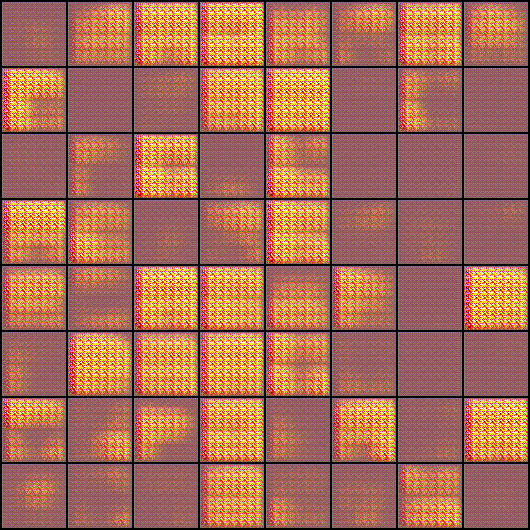

In [ ]:
Image('./generated/generated-images-0001.png')

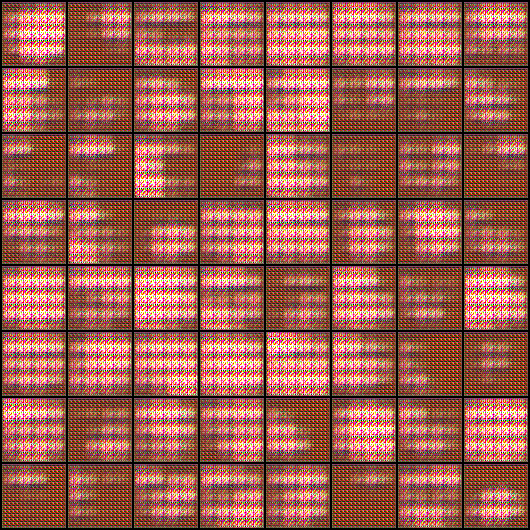

In [ ]:
Image('./generated/generated-images-0005.png')

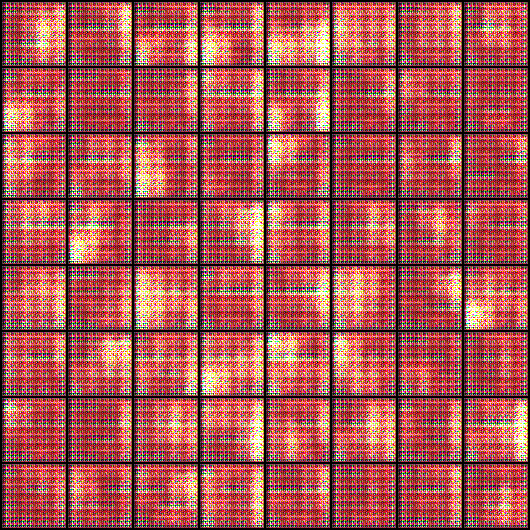

In [ ]:
Image('./generated/generated-images-0010.png')

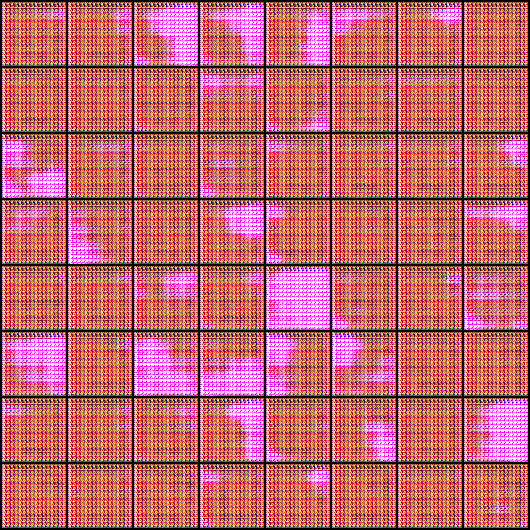

In [ ]:
Image('./generated/generated-images-0020.png')

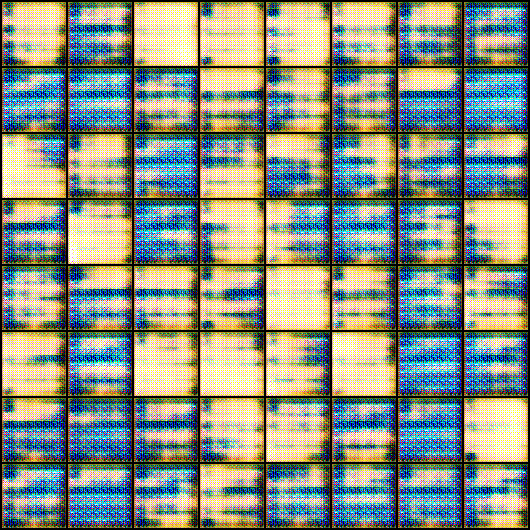

In [ ]:
Image('./generated/generated-images-0030.png')

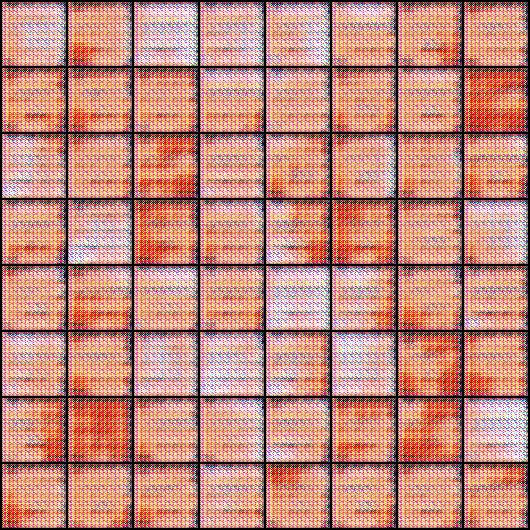

In [ ]:
Image('./generated/generated-images-0040.png')

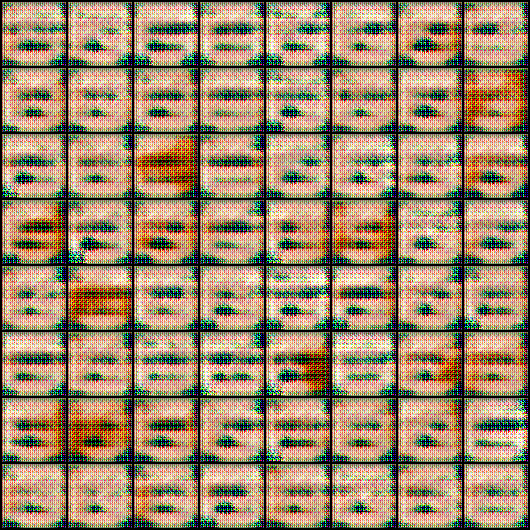

In [ ]:
Image('./generated/generated-images-0050.png')

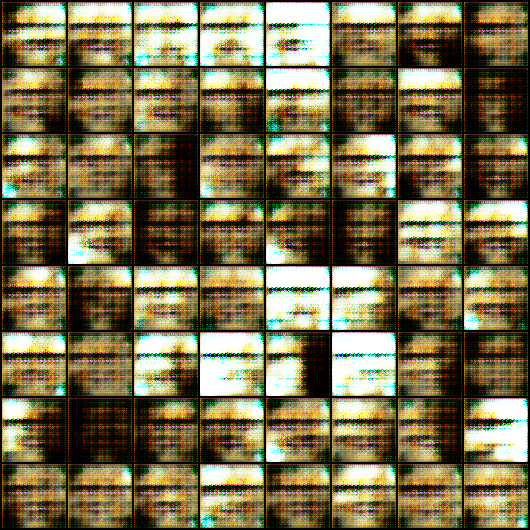

In [ ]:
Image('./generated/generated-images-0060.png')

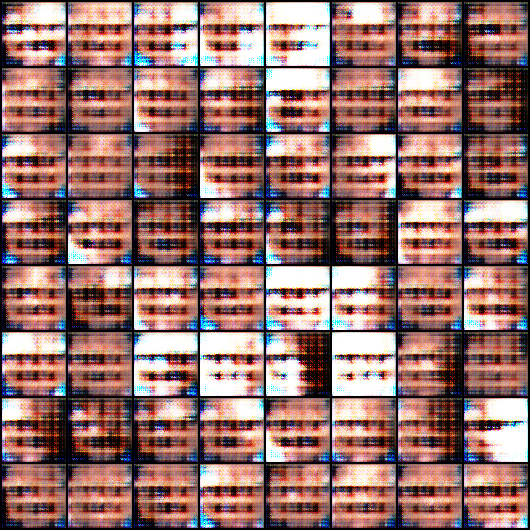

In [ ]:
Image('./generated/generated-images-0070.png')

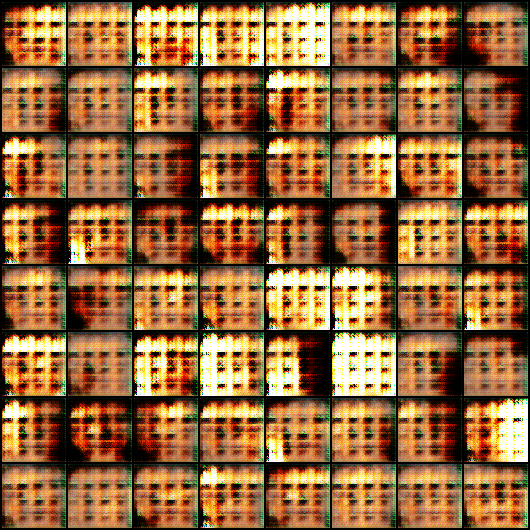

In [ ]:
Image('./generated/generated-images-0080.png')

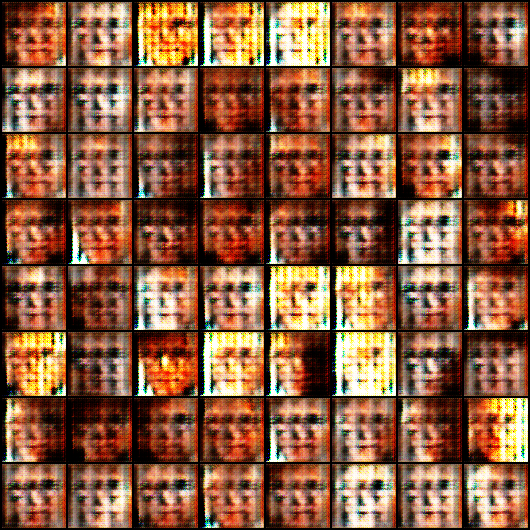

In [ ]:
Image('./generated/generated-images-0097.png')

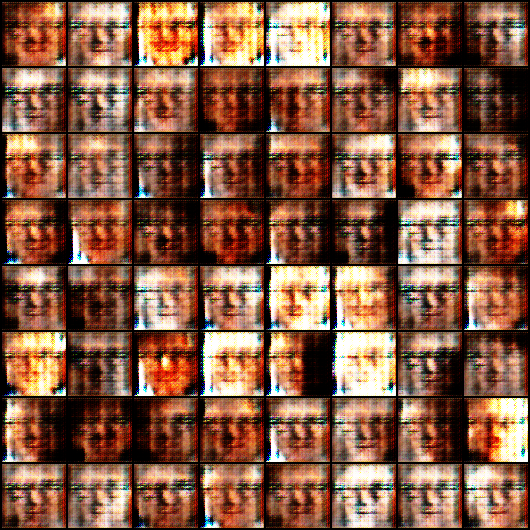

In [ ]:
Image('./generated/generated-images-0098.png')

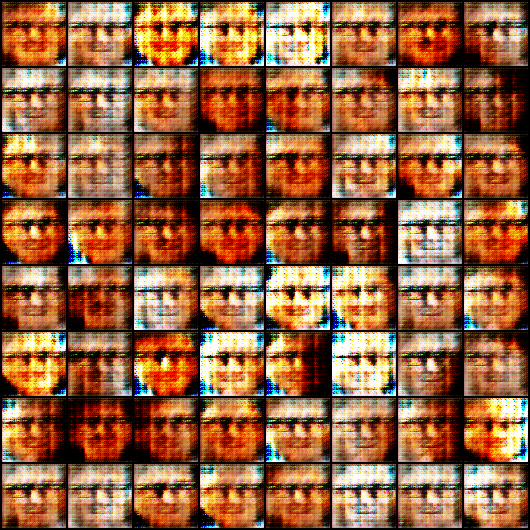

In [ ]:
Image('./generated/generated-images-0099.png')

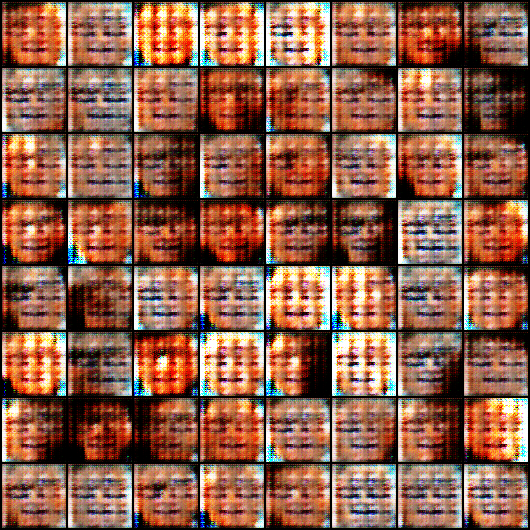

In [ ]:
Image('./generated/generated-images-0100.png')

#plot the loss of descriminator and generators

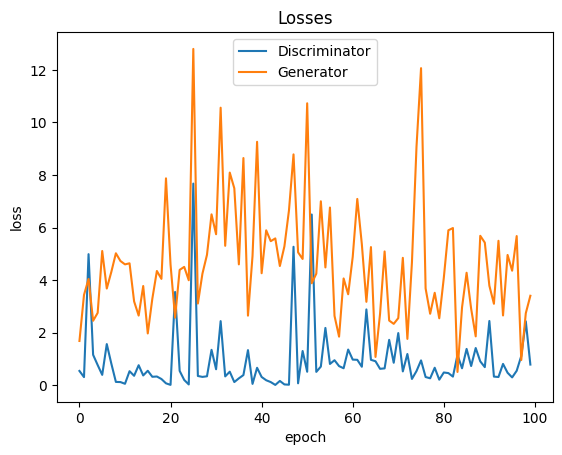

In [ ]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

#plot the real_score and fake_ score


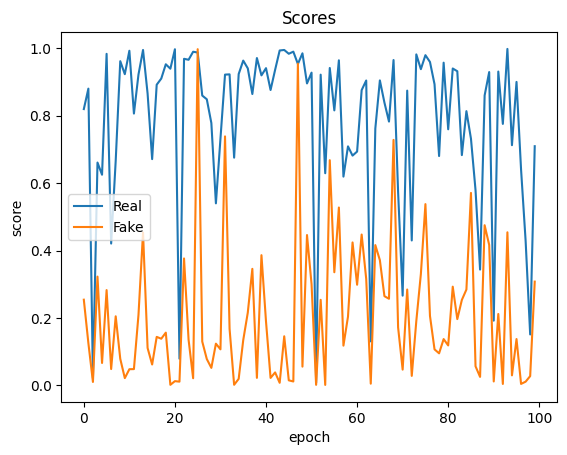

In [ ]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');

#sample images generated after each epoch into a video using OpenCV.

In [ ]:
import cv2
import os

vid_fname = 'gans_training.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 1, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()